<a href="https://colab.research.google.com/github/Murcha1990/ML_AI25/blob/main/Hometasks/Base/HW1_Regression_with_inference_base.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (base). Часть 1**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;

**Максимальная оценка за дз**
> Оценка за первую часть домашки = $min(\text{ваш балл}, 7)$


**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.**

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
import re

from ydata_profiling import ProfileReport

%matplotlib inline

random.seed(42)
np.random.seed(42)

Давайте зафиксируем важный момент.

**Задание 0 (0 баллов).**
Изучите и ответье на вопрос: для чего фиксируем сиды в домашках?

`Посев фиксируется с целью получения одинакового результата выполнения операций, основанных на случайных числах. Это делается с целью воспроизведения одних и тех же результатов (случайных разбиений и прочего) при выполнении программы`

# **Часть 1 | EDA и визуализация**

Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (2.5 балла)
- Визуализации признаков и их анализ (1 балл)

Всего можно набрать 3.5 основных балла и 0.65 бонусных. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (2.5 балла)**

In [4]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1 (0.5 балла)**

Вы уже встречались с pandas в первой половине семестра. Теперь будем постоянно (кроме некоторых случаев) использовать его для анализа данных и наслаивать навыки. Выполните операции, направленные на практику основных действий с `pandas`:

**0.1 балла**
- [ ] Отобразите 30 случайных строк тренировочного датасета.
- [ ] Отобразите первые 5 и последние 5 объектов тестового датасета
- [ ] Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения
- [ ] Посмотрите, есть ли в данных явные дубликаты


**0.2 балла**
Ответьте на вопросы:
- [ ] Выводы о чем можно сделать, используя случайные/верхние/нижние строки? А о чем нельзя?
- [ ] Достаточно ли метода duplicated для анализа дубликатов? Почему?

**0.15 балла**
- [ ] Постройте дашборд, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)

### 30 случайных строк тренировочного датасета

In [5]:
df_train.sample(30)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
6565,Renault KWID Climber 1.0 MT BSIV,2019,300000,35000,Petrol,Individual,Manual,First Owner,23.01 kmpl,999 CC,67 bhp,91Nm@ 4250rpm,5.0
2943,Maruti Wagon R LXI,2013,225000,58343,Petrol,Trustmark Dealer,Manual,First Owner,21.79 kmpl,998 CC,67.05 bhp,90Nm@ 3500rpm,5.0
2024,Hyundai i20 Asta 1.2,2013,360000,30000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
263,Hyundai i20 1.2 Asta,2010,300000,70000,Petrol,Individual,Manual,First Owner,17.0 kmpl,1197 CC,80 bhp,"11.4 kgm at 4,000 rpm",5.0
4586,Skoda Octavia L and K 1.9 TDI MT,2005,250000,120000,Diesel,Individual,Manual,Third Owner,16.4 kmpl,1896 CC,90 bhp,"21.4@ 1,900(kgm@ rpm)",5.0
4479,Maruti Ciaz ZXi,2016,700000,20000,Petrol,Individual,Manual,First Owner,20.73 kmpl,1373 CC,91.1 bhp,130Nm@ 4000rpm,5.0
4881,Hyundai Grand i10 1.2 Kappa Magna BSIV,2017,445000,27000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
3583,Ford Ecosport 1.5 DV5 MT Trend,2016,515000,68609,Diesel,Dealer,Manual,First Owner,22.7 kmpl,1498 CC,89.84 bhp,204Nm@ 2000-2750rpm,5.0
6361,Hyundai Verna 1.4 VTVT,2014,500000,33400,Petrol,Individual,Manual,First Owner,17.43 kmpl,1396 CC,105.5 bhp,135.3Nm@ 5000rpm,5.0
4108,Hyundai i20 Era 1.2,2015,490000,45900,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0


### Первые 5 и последние 5 объектов тестового датасета

In [6]:
display(df_test.head())
display(df_test.tail())

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81 kmpl,1086 CC,68.05 bhp,99.04Nm@ 4500rpm,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36 kmpl,1197 CC,78.9 bhp,111.8Nm@ 4000rpm,5.0
999,Honda City i DTec SV,2016,700000,110000,Diesel,Individual,Manual,First Owner,26.0 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0


### Посмотрим колонки с пропусками

In [7]:
train_missed_columns = df_train.columns[df_train.isnull().sum() > 0].to_list()
print('Колонки из тренировочного датасета, в которых есть пропуски:')
print(train_missed_columns, '\n')

test_missed_columns = df_train.columns[df_train.isnull().sum() > 0].to_list()
print('Колонки из тестового датасета, в которых есть пропуски:')
print(test_missed_columns)


Колонки из тренировочного датасета, в которых есть пропуски:
['mileage', 'engine', 'max_power', 'torque', 'seats'] 

Колонки из тестового датасета, в которых есть пропуски:
['mileage', 'engine', 'max_power', 'torque', 'seats']


### Посмотрим наличие дубликатов

In [8]:
print(f'В тренировочном датасете {df_train.duplicated().sum()} явных дубликатов')
print(f'В тестовом датасете {df_test.duplicated().sum()} явных дубликата')

В тренировочном датасете 985 явных дубликатов
В тестовом датасете 62 явных дубликата


- Выводы о чем можно сделать, используя случайные/верхние/нижние строки? А о чем нельзя?
- Достаточно ли метода duplicated для анализа дубликатов? Почему?

---
1. Используя случайные, верхние и нижние строки можно сделать выводы об общей структуре датасета: количестве колонок, типах данных в них и о том, что отражают значения в них. Также можно сразу определить, в каких столбцах находятся числовые признаки, а в каких категориальные.

    В то же время нельзя сделать выводы о количестве (а зачастую и о наличии) пропусков или дубликатов. Нельзя определить количество категорий у таковых признаков. Также остаются неясными законы распределения числовых признаков

2. Метода `duplicated` недостаточно, т.к. он ищет только явные дубликаты. Этот метод не обрабатывает ситуацию, когда 2 идетичные машины имею, к примеру, одну разную техническую характеристику. Например, если двигатели машин отличаются по мощности в 2 раза (при одинаковом объёме) или у них разный расход при идентичных двигателях.
---

#### Построим дашборд с помощью ydata-profiling

In [9]:
profile = ProfileReport(df_train)

profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 13/13 [00:00<00:00, 191.36it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Мы обнаружили пропуски. Давайте избавимся от них.

**(0.05 балла)**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось. Заполнение пропусков проводите для обоих наборов данных, если необходимо

**Важно!**

При заполнении пропусков и в тестовом, и тренировочном наборах данных вы определяетесь со стратегией предобработки пропущенных значений при потенциальной работе модели.

Так как в теоретическом случае вы не имеете доступа к тестовой выборке, то заполняемой значение (у нас — медиана) вы считаете про *тренировочному* набору данных и им же заполняете *тестовый*.

In [10]:
G_CONST = 9.81

def drop_units(x):
    number = str(x).rstrip('kmpl km/kg bhp CC')
    return float(number) if number else None

def parse_torque(x: str):
    if not isinstance(x, str):
        return x
    number = re.match(pattern='^(\\d+\\.*\\d*)', string=x)
    if not number:
        return None
    number = float(number.group())
    return number * G_CONST if 'kgm' in x.lower() else number

# Обработаем тренировочные данные
df_train[['mileage', 'engine', 'max_power']] = df_train[['mileage', 'engine', 'max_power']].map(lambda x: drop_units(x)).astype(float)
df_train['torque'] = df_train.torque.apply(parse_torque)

# Обработаем тестовые данные
df_test[['mileage', 'engine', 'max_power']] = df_test[['mileage', 'engine', 'max_power']].map(lambda x: drop_units(x)).astype(float)
df_test['torque'] = df_test.torque.apply(parse_torque)



In [11]:

train_medians = df_train.median(numeric_only=True)

df_train = df_train.fillna(value=train_medians)
df_test = df_test.fillna(value=train_medians)

print('Пропуски в тренировочных данных')
display(df_train.isna().sum())

print('Пропуски в тестовых данных')
display(df_test.isna().sum())

Пропуски в тренировочных данных


name             0
year             0
selling_price    0
km_driven        0
fuel             0
seller_type      0
transmission     0
owner            0
mileage          0
engine           0
max_power        0
torque           0
seats            0
dtype: int64

Пропуски в тестовых данных


name             0
year             0
selling_price    0
km_driven        0
fuel             0
seller_type      0
transmission     0
owner            0
mileage          0
engine           0
max_power        0
torque           0
seats            0
dtype: int64

### **Задание 2 (0.5 балла)**

На прошлом шаге вы рассмотрели дубликаты. Однако дубликат может быть связан с не только полным повторением информации в нескольких строках, но и частиным. Например, объект мог был внесен в базу данных с разным значением целевой переменной. В этом шаге займемся такими дублями!

**Ваши действия:**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.1 балла)
- [ ] Отобразите такие объекты (0.15 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.15 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.1 балла)


### Посмотрим кол-во объектов с одинаковым признаковым описанием

In [12]:
print('Объектов, отличающихся только целевой переменной: ', end='')
print(df_train.drop('selling_price', axis=1).duplicated().sum())

Объектов, отличающихся только целевой переменной: 1159


### Отобразим эти объекты

In [13]:
df_train[df_train.drop('selling_price', axis=1).duplicated()]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,450000,35000,Petrol,Individual,Manual,First Owner,18.90,1197.0,82.00,114.0,5.0
258,Maruti Swift VXI,2012,330000,50000,Petrol,Individual,Manual,Second Owner,18.60,1197.0,85.80,114.0,5.0
268,Maruti Swift Dzire VXI,2014,400000,70000,Petrol,Individual,Manual,Second Owner,19.10,1197.0,85.80,114.0,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,2625000,9000,Diesel,Dealer,Automatic,First Owner,13.60,1999.0,177.00,430.0,5.0
325,Lexus ES 300h,2019,5150000,20000,Petrol,Dealer,Automatic,First Owner,22.37,2487.0,214.56,202.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6947,Chevrolet Spark 1.0 LS,2010,140000,60000,Petrol,Individual,Manual,Second Owner,18.00,995.0,62.00,90.3,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,746000,24000,Diesel,Individual,Manual,First Owner,24.40,1498.0,98.63,215.0,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59,1248.0,74.00,190.0,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57,1396.0,70.00,140.0,5.0


### Удалим эти объекты

In [14]:
df_train = df_train.drop_duplicates(df_train.columns.drop('selling_price'))

In [15]:
assert df_train.shape == (5840, 13)

Отлично! Мы избавились от маленьких и явных проблем. Теперь перейдем к более сложным недостаткам полученной таблицы.

### **Задание 3 (0.25 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Удалите столбец ``torque``


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.
- Стобец ``torque`` мы удаляем для простоты. В идеальном случае, его также стоило бы предобработать.

---
#### Столбцы `mileage`, `engine`, `max_power` и `torque` были обработаны выше в Задании №1
#### Удалим столбец `torque` и привёдем типы
---

In [16]:
df_train = df_train.drop('torque', axis=1)
df_test = df_test.drop('torque', axis=1)

# Приведём mileage, engine и max_power в тренировочных данных к float
df_train[['mileage', 'engine', 'max_power']] = df_train[['mileage', 'engine', 'max_power']].astype(float)

# Приведём mileage, engine и max_power в тестовых данных к float
df_test[['mileage', 'engine', 'max_power']] = df_test[['mileage', 'engine', 'max_power']].astype(float)


### **Задание 4 (0.1 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.

#### Приведём столбцы `seats` и `engine` к int

In [17]:
df_train[['seats', 'engine']] = df_train[['seats', 'engine']].astype(int)
df_test[['seats', 'engine']] = df_test[['seats', 'engine']].astype(int)

### **Задание 5 (0.15 балла)**

Отлично! Мы провели "косметическую" предобработку и теперь готовы сделать важный шаг в контексте анализа данных. А именно — посмотреть на статистики!

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сделайте вывод.

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

**Примечание:**

Более корректно рассматривать статистики до заполнения пропусков и после, чтобы убедиться, что мы не внесли каких-либо серьезных сдвигов в изначальные рапсределения.

### Посмотрим на статистики по числовым столбцам

1. Для трейна:

In [18]:
df_train.describe(exclude='object')

,year,selling_price,km_driven,mileage,engine,max_power,seats
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.428611,1429.448973,87.910782,5.426712
std,4.095622,5.354320e+05,6.007114e+04,3.986026,485.662834,31.639585,0.982344
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,2.000000
25%,2011.000000,2.500000e+05,3.900000e+04,16.950000,1197.000000,68.000000,5.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.300000,1248.000000,81.860000,5.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.300000,1498.000000,99.000000,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,14.000000


2. Для теста:

In [19]:
df_test.describe(exclude='object')

,year,selling_price,km_driven,mileage,engine,max_power,seats
count,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000
mean,2013.681000,6.179010e+05,71393.341000,19.337480,1454.87600,90.844330,5.403000
std,4.012149,7.585539e+05,48486.218662,3.951751,521.99574,34.892709,0.912921
min,1995.000000,3.100000e+04,1303.000000,0.000000,624.00000,34.200000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,16.550000,1197.00000,69.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,19.300000,1248.00000,82.425000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,22.300000,1582.00000,102.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,32.260000,3604.00000,280.000000,9.000000


### Посмотрим на статистики по категориальным столбцам

1. Для трейна:

In [20]:
df_train.describe(include='object')

,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,1924,4,3,2,5
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
freq,91,3177,5223,5336,3603


2. Для теста:

In [21]:
df_test.describe(include='object')

,name,fuel,seller_type,transmission,owner
count,1000,1000,1000,1000,1000
unique,621,4,3,2,5
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner
freq,15,534,837,877,623


#### Выводы:
 - У столбцов `selling_price` и `km_driven` довольно большое стандартное отклонение, что может говорить о большом разбросе значений в данных
 - В трейне минимальные значения в столбцах `mileage` и `max_power` могут свидетельствовать об аномалях в данных
 - Наблюдается ассиметрия в значениях признаков `seller_type` и `transmittion`: доминирующие значения - `Individual` и `Manual` соответственно

*Столбец `tourque` ранее удалён, так что ассерт не проходит (там должно быть 12)*

In [22]:
# assert df_train.shape == (5840, 13)

## **Визуализации (1 балл + 0.5 бонус)**



Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 6 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

#### 1. Построим pairplot по трейну

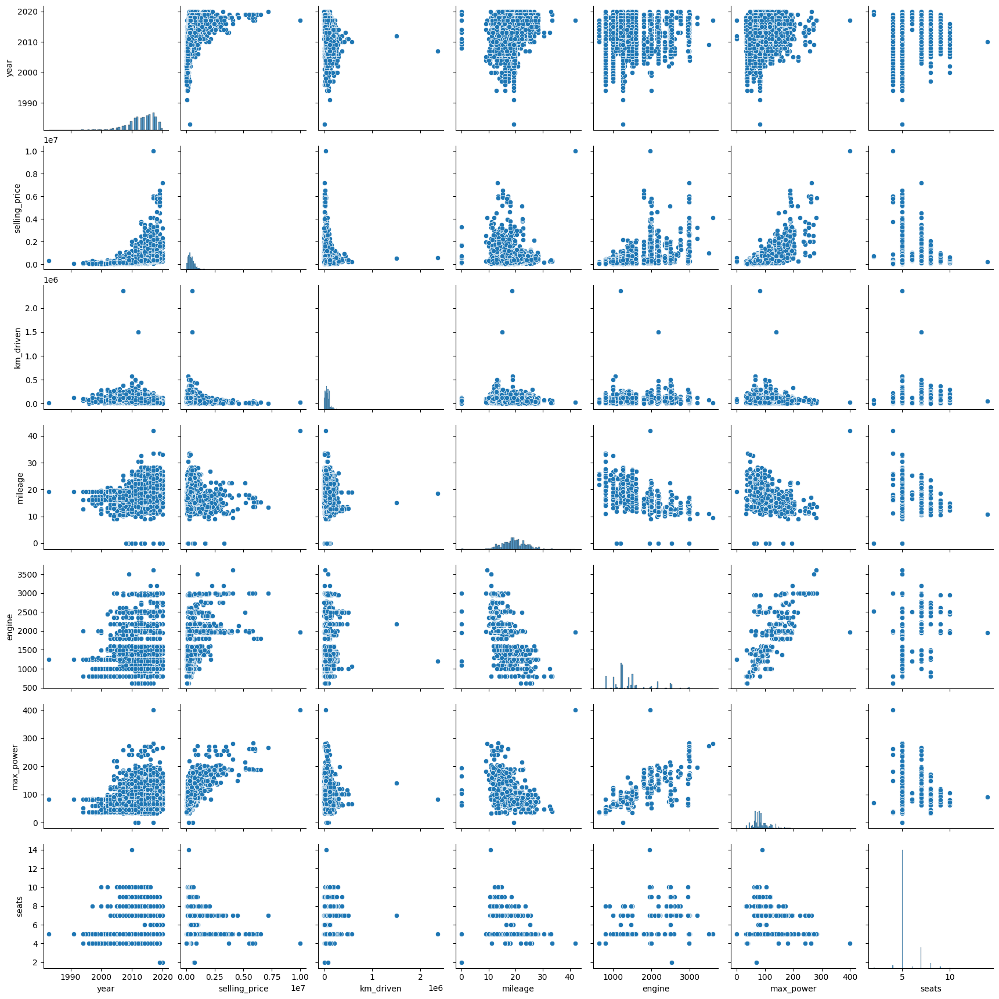

In [23]:
sns.pairplot(df_train)

Выводы:
 - Можно предположить связь признаком с целевой переменной: видна зависимость между целевой переменной `selling_price` и признаками `max_power`, `km_driven` и `year`. Если для `max_power` зависимость похожа на линейную, то для `km_driven` и `year` больше напоминает квадратичную
 - Можно выдвинуть гипотезу о корреляциях признаков: прослеживается попарная зависимость между признаками `engine`, `max_power` и `mileage`, что логично. Зависимости более похожи на линейные

#### 2. Построим pairplot по тестовым данным

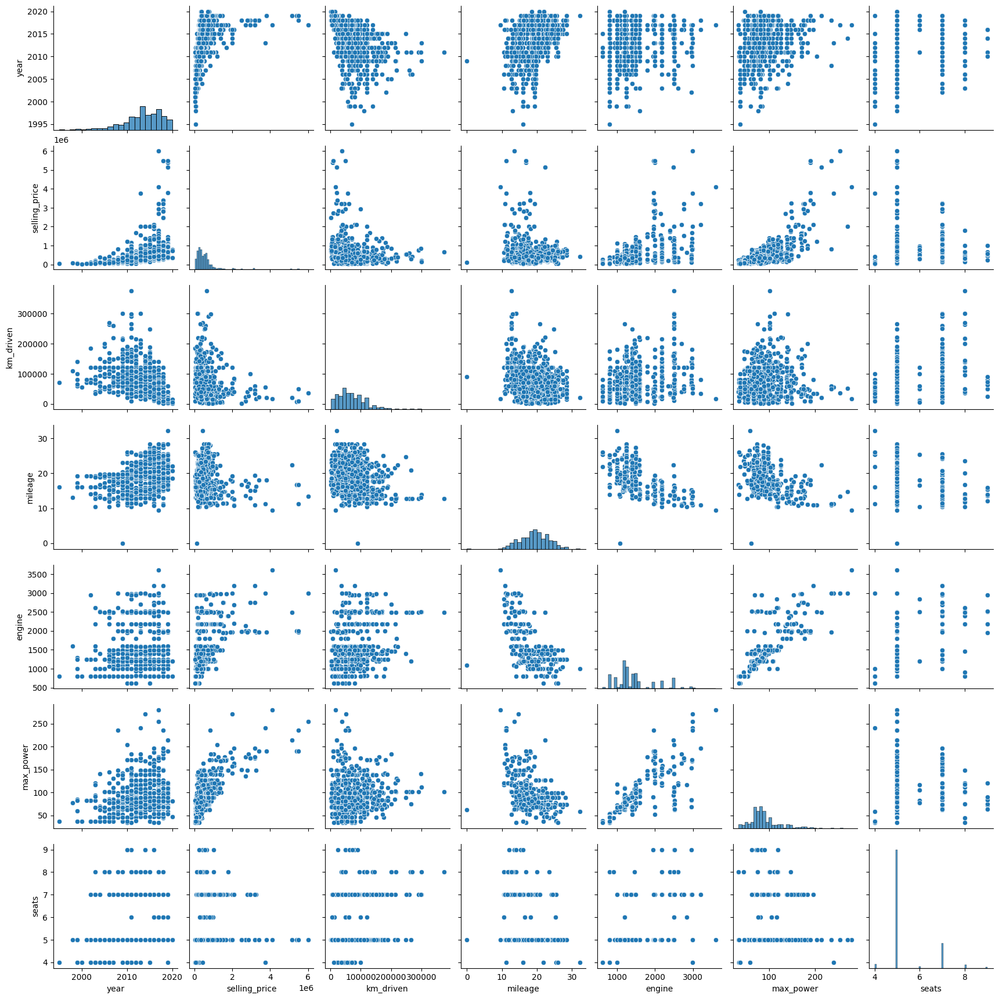

In [24]:
sns.pairplot(df_test)

> Зависимости, наблюдаемые при рассмотрении тренировочных данных, прослеживаются и на тестовых. Следовательно, валидны гипотезы и предположения, сделанные для тренировочной выборки. Из этого можно сделать вывод, что тренировочная и тестовая совокупности похожи

### **Задание 7 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)


<Axes: >

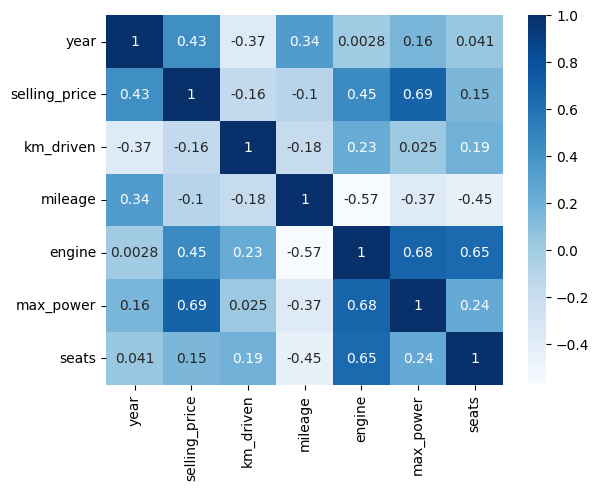

In [25]:
sns.heatmap(df_train.corr(numeric_only=True), cmap='Blues', annot=True)

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

1. Признаки `engine` и `year` обладают наименьшей корреляцией - `0.0028`
2. У признака `engine` наблюдается довольно сильная положительная линейная зависимость с признаками `seats`, `max_power`
3. Несмотря на то, что на pairplot из пункта выше строгой линейной зависимости не наблюдается, значительная отрицательная корреляция в `-0.37` указывает на то, что зависимость похожа на линейную и имеет обратный характер

### **Бонус (0.5 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их **и поясните.**

- Каждая дополнительная визуализация может принести до 0.25 баллов при условии, что она обоснована.

boxplot, чтобы оценить наличие, кол-во и кач-во аномалий в данных и piechart(возможно, что-то другое), чтобы явно показать симметрию/ассиметрию распределения объектов по категориям для категориальных признаков

1. Построим boxplot, чтобы провести визуальны количественный и качественный анализ аномалий в данных, предварительно отмасштабировав их и отбросив целевую переменную

<Axes: >

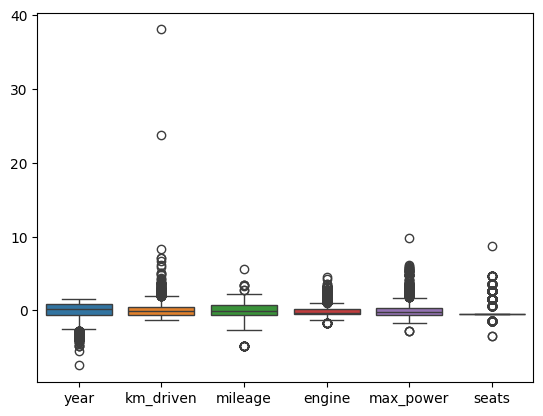

In [26]:
df_train_numeric = df_train.select_dtypes(include='number')
df_train_scaled = (df_train_numeric - df_train_numeric.mean()) / df_train_numeric.std()
sns.boxplot(df_train_scaled.drop('selling_price', axis=1))

Видно, что у признака `km_driven` присутствуют 2 значительные аномалии

2. Построим гистограммы для категориальных признаков, чтобы оценить симметрию/ассиметрию распределения объектов по категориям

([0, 1, 2, 3, 4],
 [Text(0, 0, 'First Owner'),
  Text(1, 0, 'Second Owner'),
  Text(2, 0, 'Third Owner'),
  Text(3, 0, 'Fourth & Above Owner'),
  Text(4, 0, 'Test Drive Car')])

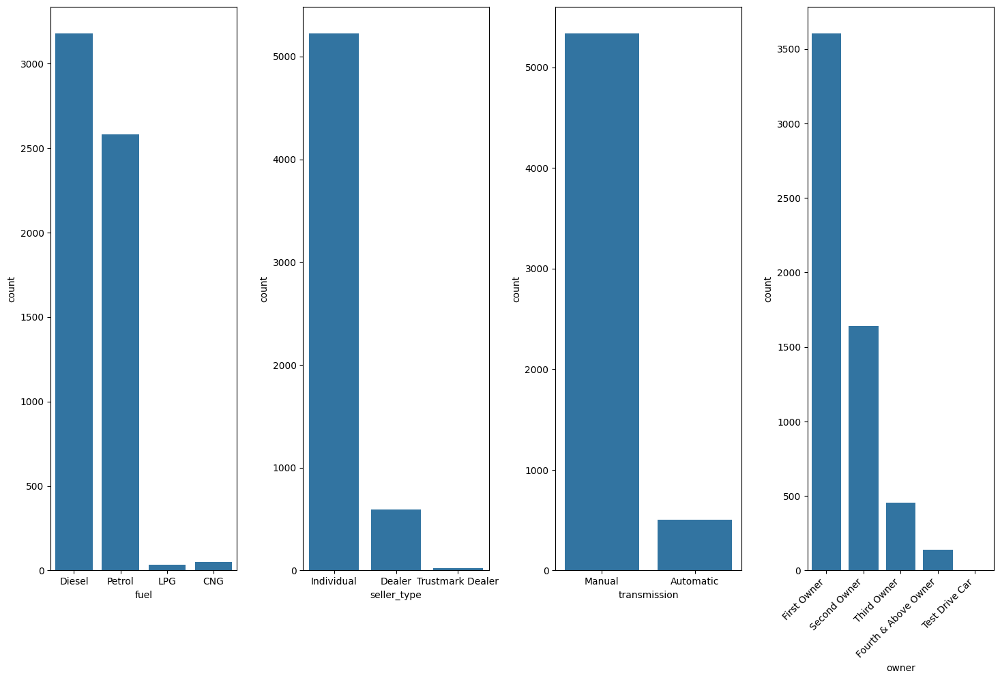

In [27]:
fig, axes = plt.subplots(1, 4, figsize=(15, 9))

df_train_cat = df_train.select_dtypes(include='object').drop('name', axis=1)

for i, col in enumerate(df_train_cat.columns):
    sns.countplot(df_train_cat, x=col, ax=axes[i])

plt.tight_layout()
plt.xticks(rotation=45, ha='right')

In [28]:
import pickle

from matplotlib.pylab import f


df_train.to_csv('./datasets/train_dataset.csv', index=False)
df_test.to_csv('./datasets/test_dataset.csv', index=False) 
df_test.drop('selling_price', axis=1).to_csv('./datasets/test_dataset_nosl.csv', index=False)

# df_train.columns
with open('./model/feature_names.pkl', 'wb') as file:
    pickle.dump(df_train.columns.drop('selling_price').to_list(), file)

Видно, что у всех категориальных признаков есть асимметрия в распределении объектов. 

# **Часть 2 | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.25 балла;

### **Задание 8 (0.05 балла)**

Сделайте тренировочный и тестовый наборы. Сделайте на тренировочный и тестовый наборы. Она уже даны, достаточно просто отделить целевой признак Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных. Используйте уже имеющиеся данные train и test при разбиении. Если считаете уместным применить какую-то более хитрую технику разбиения — примените, но опишите, зачем.

In [29]:
df_test_numeric = df_test.copy().select_dtypes(include='number')

In [30]:
y_train = df_train_numeric.selling_price
X_train = df_train_numeric.drop('selling_price', axis=1)

In [31]:
X_train.describe()

,year,km_driven,mileage,engine,max_power,seats
count,5840.000000,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,7.395224e+04,19.428611,1429.448973,87.910782,5.426712
std,4.095622,6.007114e+04,3.986026,485.662834,31.639585,0.982344
min,1983.000000,1.000000e+00,0.000000,624.000000,0.000000,2.000000
25%,2011.000000,3.900000e+04,16.950000,1197.000000,68.000000,5.000000
50%,2014.000000,7.000000e+04,19.300000,1248.000000,81.860000,5.000000
75%,2017.000000,1.000000e+05,22.300000,1498.000000,99.000000,5.000000
max,2020.000000,2.360457e+06,42.000000,3604.000000,400.000000,14.000000


In [32]:
y_test = df_test_numeric.selling_price
X_test = df_test_numeric.drop('selling_price', axis=1)

### **Задание 9 (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [33]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

linear_model = LinearRegression()
linear_model.fit(X_train, y_train)
train_pred = linear_model.predict(X_train)
linreg_test_pred = linear_model.predict(X_test)

print('R^2 train:', r2_score(y_true=y_train, y_pred=train_pred))
print('MSE train:', MSE(y_true=y_train, y_pred=train_pred))

print('R^2 test:', r2_score(y_true=y_test, y_pred=linreg_test_pred))
print('MSE test:', MSE(y_true=y_test, y_pred=linreg_test_pred))

R^2 train: 0.5922629595849875
MSE train: 116873067751.52162
R^2 test: 0.5941441219017134
MSE test: 233297548204.61063


### **Задание 10 (0.15 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [34]:
import pickle
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train, y_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

linear_model.fit(X_train_scaled, y_train)

train_pred = linear_model.predict(X_train_scaled)
scaled_test_pred = linear_model.predict(X_test_scaled)

print('R^2 train:', r2_score(y_true=y_train, y_pred=train_pred))
print('MSE train:', MSE(y_true=y_train, y_pred=train_pred))

print('R^2 test:', r2_score(y_true=y_test, y_pred=scaled_test_pred))
print('MSE test:', MSE(y_true=y_test, y_pred=scaled_test_pred))

with open('./model/scaler.pkl', 'wb') as f:
    pickle.dump(scaler, f)

R^2 train: 0.5922629595849875
MSE train: 116873067751.52162
R^2 test: 0.5941441219017262
MSE test: 233297548204.6033


### **Задание 11 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [35]:
pd.DataFrame(data=scaler.scale_, index=X_train.columns).reset_index().sort_values(by=0, ascending=False)


,index,0
1,km_driven,60065.993207
3,engine,485.621251
4,max_power,31.636876
0,year,4.095271
2,mileage,3.985685
5,seats,0.982260


Самый информативный признак - `km_driven`

### **Задание 12 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [36]:
from sklearn.linear_model import Lasso

lasso_model = Lasso()

lasso_model.fit(X_train_scaled, y_train)

train_pred = lasso_model.predict(X_train_scaled)
lasso_test_pred = lasso_model.predict(X_test_scaled)

print('R^2 train:', r2_score(y_true=y_train, y_pred=train_pred))
print('MSE train:', MSE(y_true=y_train, y_pred=train_pred))

print('R^2 test:', r2_score(y_true=y_test, y_pred=lasso_test_pred))
print('MSE test:', MSE(y_true=y_test, y_pred=lasso_test_pred))

R^2 train: 0.5922629595497046
MSE train: 116873067761.63504
R^2 test: 0.5941429546560312
MSE test: 233298219170.76022


In [37]:
pd.DataFrame(data=lasso_model.coef_, index=X_train.columns).reset_index().sort_values(by=0, ascending=False)

,index,0
4,max_power,322780.586197
0,year,152843.083853
3,engine,61172.025780
2,mileage,28779.204085
5,seats,-23217.693273
1,km_driven,-44146.918538


Регуляризация не занулила веса. Так произошло скорее всего из-за низкого коэффициента $`\alpha`$.

### **Задание 13 Финальный рывок (0.5 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [38]:
from sklearn.model_selection import GridSearchCV
params = {'alpha': np.arange(0.01, 10, 0.05)}
model = Lasso()
gs = GridSearchCV(model, params, cv=10, scoring='neg_mean_squared_error', verbose=3)
gs.fit(X_train_scaled, y_train)

Fitting 10 folds for each of 200 candidates, totalling 2000 fits
[CV 1/10] END ...........alpha=0.01;, score=-312965418999.682 total time=   0.0s
[CV 2/10] END ............alpha=0.01;, score=-75843045277.626 total time=   0.0s
[CV 3/10] END ............alpha=0.01;, score=-93189212070.608 total time=   0.0s
[CV 4/10] END ............alpha=0.01;, score=-97559512934.778 total time=   0.0s
[CV 5/10] END ............alpha=0.01;, score=-73491290009.390 total time=   0.0s
[CV 6/10] END ...........alpha=0.01;, score=-111617498669.722 total time=   0.0s
[CV 7/10] END ...........alpha=0.01;, score=-187376466604.297 total time=   0.0s
[CV 8/10] END ............alpha=0.01;, score=-79983530949.404 total time=   0.0s
[CV 9/10] END ............alpha=0.01;, score=-57450339456.681 total time=   0.0s
[CV 10/10] END ..........alpha=0.01;, score=-123678159134.955 total time=   0.0s
[CV 1/10] END alpha=0.060000000000000005;, score=-312965471687.523 total time=   0.0s
[CV 2/10] END alpha=0.06000000000000000

,estimator,Lasso()
,param_grid,"{'alpha': array([0.01, ... 9.91, 9.96])}"
,scoring,'neg_mean_squared_error'
,n_jobs,None
,refit,True
,cv,10
,verbose,3
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,alpha,np.float64(9.96)


In [39]:
train_pred = gs.predict(X_train_scaled)
lasso_gs_test_pred = gs.predict(X_test_scaled)


print('R^2 train:', r2_score(y_true=y_train, y_pred=train_pred))
print('MSE train:', MSE(y_true=y_train, y_pred=train_pred))

print('R^2 test:', r2_score(y_true=y_test, y_pred=lasso_gs_test_pred))
print('MSE test:', MSE(y_true=y_test, y_pred=lasso_gs_test_pred))

R^2 train: 0.5922629560865244
MSE train: 116873068754.31528
R^2 test: 0.5941324773038581
MSE test: 233304241851.97675


 - Грид сёрчу пришлось обучить 2000 моделей

In [40]:
print('Коэффициент регуляризации у лучшей из моделей:', gs.best_params_['alpha'])

Коэффициент регуляризации у лучшей из моделей: 9.96


Посмотрим, обнулились ли веса

In [41]:
pd.DataFrame(data=gs.best_estimator_.coef_, index=X_train.columns)

,0
year,152841.170080
km_driven,-44136.878333
mileage,28762.667112
engine,61128.682455
max_power,322788.657315
seats,-23191.743034


Как видно, веса при данной регуляризации не занулились

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [42]:
from sklearn.linear_model import ElasticNet

params = {'alpha': np.arange(0.01, 10, 0.05), 'l1_ratio': np.arange(0.05, 1, 0.05)}
model = ElasticNet()
gs = GridSearchCV(model, params, cv=10, scoring='neg_mean_squared_error', verbose=3)
gs.fit(X_train_scaled, y_train)

Fitting 10 folds for each of 3800 candidates, totalling 38000 fits
[CV 1/10] END alpha=0.01, l1_ratio=0.05;, score=-315170451597.060 total time=   0.0s
[CV 2/10] END alpha=0.01, l1_ratio=0.05;, score=-75315483869.624 total time=   0.0s
[CV 3/10] END alpha=0.01, l1_ratio=0.05;, score=-92972149750.431 total time=   0.0s
[CV 4/10] END alpha=0.01, l1_ratio=0.05;, score=-97295755376.678 total time=   0.0s
[CV 5/10] END alpha=0.01, l1_ratio=0.05;, score=-72786436225.692 total time=   0.0s
[CV 6/10] END alpha=0.01, l1_ratio=0.05;, score=-111810345503.210 total time=   0.0s
[CV 7/10] END alpha=0.01, l1_ratio=0.05;, score=-187488236231.107 total time=   0.0s
[CV 8/10] END alpha=0.01, l1_ratio=0.05;, score=-79629622284.744 total time=   0.0s
[CV 9/10] END alpha=0.01, l1_ratio=0.05;, score=-56828859524.652 total time=   0.0s
[CV 10/10] END alpha=0.01, l1_ratio=0.05;, score=-123588207232.049 total time=   0.0s
[CV 1/10] END alpha=0.01, l1_ratio=0.1;, score=-315055534208.104 total time=   0.0s
[CV 

,estimator,ElasticNet()
,param_grid,"{'alpha': array([0.01, ... 9.91, 9.96]), 'l1_ratio': array([0.05, ..., 0.9 , 0.95])}"
,scoring,'neg_mean_squared_error'
,n_jobs,None
,refit,True
,cv,10
,verbose,3
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,alpha,np.float64(0....0000000000005)


In [43]:
train_pred = gs.predict(X_train_scaled)
elnet_gs_test_pred = gs.predict(X_test_scaled)


print('R^2 train:', r2_score(y_true=y_train, y_pred=train_pred))
print('MSE train:', MSE(y_true=y_train, y_pred=train_pred))

print('R^2 test:', r2_score(y_true=y_test, y_pred=elnet_gs_test_pred))
print('MSE test:', MSE(y_true=y_test, y_pred=elnet_gs_test_pred))

R^2 train: 0.5921444043237081
MSE train: 116907050234.61832
R^2 test: 0.590844970094775
MSE test: 235193994872.625


- GridSearch пришлось обучить 38000 моделей

Посмотрим, какие гиперпараметры соответствуют лучшей модели

In [44]:
print('alpha:', gs.best_params_['alpha'])
print('l1_ratio:', gs.best_params_['l1_ratio'])


alpha: 0.060000000000000005
l1_ratio: 0.7500000000000001


# **Часть 3| Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.75 основных балла и 0.25 бонусных.


**Задание 14 (0.1 балла)** Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

В этом домашнем задании мы предлагаем удалить его.

**Ваша задача:**
- [ ] Удалить столбец`name`

Соединим наши числовые тренировочный и тестовый датасеты с категориальными признаками, а затем обработам признак `name`

In [45]:
df_train_cat = df_train.copy().select_dtypes(include='object').reset_index(drop=True)
df_train_num_scaled = pd.DataFrame(data=X_train_scaled, columns=X_train.columns)
X_train_cat = pd.concat([df_train_num_scaled, df_train_cat], axis=1)
X_train_cat

,year,km_driven,mileage,engine,max_power,seats,name,fuel,seller_type,transmission,owner
0,0.139570,1.191152,0.996413,-0.373643,-0.439701,-0.434419,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
1,0.139570,0.766619,0.429384,0.141162,0.493387,-0.434419,Skoda Rapid 1.5 TDI Ambition,Diesel,Individual,Manual,Second Owner
2,-0.837167,0.883158,0.896054,-0.068879,0.066037,-0.434419,Hyundai i20 Sportz Diesel,Diesel,Individual,Manual,First Owner
3,-1.569719,0.766619,-0.835142,-0.270682,0.009142,-0.434419,Maruti Swift VXI BSIII,Petrol,Individual,Manual,First Owner
4,0.872122,-0.482007,0.178486,-0.478663,-0.191257,-0.434419,Hyundai Xcent 1.2 VTVT E Plus,Petrol,Individual,Manual,First Owner
...,...,...,...,...,...,...,...,...,...,...,...
5835,-1.325535,1.948653,-0.378507,-0.707236,-0.815845,-0.434419,Hyundai Santro Xing GLS,Petrol,Individual,Manual,First Owner
5836,-0.104614,-0.398765,-0.132627,-0.888447,-0.657801,-0.434419,Maruti Wagon R VXI BS IV with ABS,Petrol,Individual,Manual,Second Owner
5837,-0.104614,0.600136,-0.232987,-0.478663,-0.159965,-0.434419,Hyundai i20 Magna,Petrol,Individual,Manual,First Owner
5838,-1.569719,0.749971,-0.659513,0.130865,0.698211,-0.434419,Hyundai Verna CRDi SX,Diesel,Individual,Manual,Fourth & Above Owner


In [46]:
df_test_cat = df_test.copy().select_dtypes(include='object').reset_index(drop=True)
df_test_num_scaled = pd.DataFrame(data=X_test_scaled, columns=X_test.columns)
X_test_cat = pd.concat([df_test_num_scaled, df_test_cat], axis=1)
X_test_cat

,year,km_driven,mileage,engine,max_power,seats,name,fuel,seller_type,transmission,owner
0,-0.837167,1.565740,-1.362027,2.200379,0.761428,1.601702,Mahindra Xylo E4 BS IV,Diesel,Individual,Manual,First Owner
1,0.872122,-0.814974,0.519707,0.139102,0.650798,-0.434419,Tata Nexon 1.5 Revotorq XE,Diesel,Individual,Manual,First Owner
2,-1.569719,2.405866,-1.638015,0.760986,1.330385,-0.434419,Honda Civic 1.8 S AT,Petrol,Individual,Automatic,First Owner
3,0.383754,1.648982,1.422940,0.141162,0.337872,-0.434419,Honda City i DTEC VX,Diesel,Individual,Manual,First Owner
4,-0.592983,-0.065798,-0.734782,-0.530144,-0.724180,-0.434419,Tata Indica Vista Aura 1.2 Safire BSIV,Petrol,Individual,Manual,Second Owner
...,...,...,...,...,...,...,...,...,...,...,...
995,-1.325535,0.433652,0.095690,-0.707236,-0.627773,-0.434419,Hyundai i10 Magna 1.1L,Petrol,Individual,Manual,Second Owner
996,0.872122,-0.398765,-0.207897,-0.478663,-0.192206,-0.434419,Hyundai i20 2015-2017 Sportz 1.2,Petrol,Individual,Manual,Second Owner
997,-1.081351,-0.565249,0.896054,-0.068879,0.066037,-0.434419,Hyundai i20 Era Diesel,Diesel,Individual,Manual,First Owner
998,-0.348799,-0.814974,0.233683,-0.478663,-0.284819,-0.434419,Hyundai i10 Asta,Petrol,Individual,Manual,First Owner


В другом случае, конечно, мы могли бы предобработать данный столбец. В качестве бонуса предлагаем вам придумать и реализовать алгоритм предобработки.

**Бонус 0.25 балла**
- [ ] Предобработайте столбец `name`, чтобы избежать его удаления. Если предобработали столбец — можно закомментировать assert

> Выделим из названия автомобиля только марку, как наиболее информативную часть, которая может указывать на класс автомобиля

In [47]:
# assert X_train_cat.shape == (5840, 10)

In [48]:
X_train_cat.name = X_train_cat.name.apply(lambda x: x.split()[0])
X_test_cat.name = X_test_cat.name.apply(lambda x: x.split()[0])

In [49]:
X_train_cat.describe(include='object')


,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,30,4,3,2,5
top,Maruti,Diesel,Individual,Manual,First Owner
freq,1804,3177,5223,5336,3603


### **Задание 15 (0.4 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования. Обратите внимание, что во избежание мультиколлинеарности следует избавиться от одного из полученных столбцов при кодировании каждого признака методом OneHot.

In [50]:
from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas
from sklearn.compose import ColumnTransformer

cat_cols = X_train_cat.select_dtypes('object').columns.to_list()
cat_cols.append('seats')

ct = ColumnTransformer(
    transformers=[
        ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore'), cat_cols),
    ],
    remainder='passthrough'
)

ct.fit(X_train_cat)

X_train_cat_dum = ct.transform(X_train_cat)
X_test_cat_dum  = ct.transform(X_test_cat)

with open('./model/column_transformer.pkl', 'wb') as f:
    pickle.dump(ct, f)

/home/elnikov/ml_hw_1/.venv/lib/python3.12/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


### **Задание 16 (0.25 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [51]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

model = Ridge()
params = {'alpha': np.arange(0.01, 10, 0.05)}
gs = GridSearchCV(model, params, cv=10, scoring='r2', verbose=3)
gs.fit(X_train_cat_dum, y_train)

Fitting 10 folds for each of 200 candidates, totalling 2000 fits
[CV 1/10] END .......................alpha=0.01;, score=0.718 total time=   0.0s
[CV 2/10] END .......................alpha=0.01;, score=0.802 total time=   0.0s
[CV 3/10] END .......................alpha=0.01;, score=0.748 total time=   0.0s
[CV 4/10] END .......................alpha=0.01;, score=0.655 total time=   0.0s
[CV 5/10] END .......................alpha=0.01;, score=0.548 total time=   0.0s
[CV 6/10] END .......................alpha=0.01;, score=0.813 total time=   0.0s
[CV 7/10] END .......................alpha=0.01;, score=0.689 total time=   0.0s
[CV 8/10] END .......................alpha=0.01;, score=0.642 total time=   0.0s
[CV 9/10] END .......................alpha=0.01;, score=0.724 total time=   0.0s
[CV 10/10] END ......................alpha=0.01;, score=0.731 total time=   0.0s
[CV 1/10] END .......alpha=0.060000000000000005;, score=0.717 total time=   0.0s
[CV 2/10] END .......alpha=0.060000000000000

,estimator,Ridge()
,param_grid,"{'alpha': array([0.01, ... 9.91, 9.96])}"
,scoring,'r2'
,n_jobs,None
,refit,True
,cv,10
,verbose,3
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,alpha,np.float64(2.06)


In [52]:
train_pred = gs.predict(X_train_cat_dum)
ridge_cat_test_pred = gs.predict(X_test_cat_dum)


print('R^2 train:', r2_score(y_true=y_train, y_pred=train_pred))
print('MSE train:', MSE(y_true=y_train, y_pred=train_pred))

print('R^2 test:', r2_score(y_true=y_test, y_pred=ridge_cat_test_pred))
print('MSE test:', MSE(y_true=y_test, y_pred=ridge_cat_test_pred))

with open('./model/model.pkl', 'wb') as f:
    pickle.dump(gs.best_estimator_, f)


R^2 train: 0.7664893383653983
MSE train: 66933108039.792915
R^2 test: 0.7738582228516592
MSE test: 129992751127.6917


# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 17 (0.5 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какая лучше всего решает задачу бизнеса

In [51]:
def business_metric(y_true, y_pred):
    delta = (np.abs(y_true - y_pred) / y_true) * 100
    del_mask = delta <= 10
    metric = del_mask.sum() / len(del_mask)
    return metric

print('Business metric on test set:')
print(f'Linreg: {business_metric(ridge_cat_test_pred, y_test)}')
print(f'LinReg + scaler: {business_metric(y_test, scaled_test_pred)}')
print(f'Lasso: {business_metric(y_test, lasso_test_pred)}')
print(f'Lasso + GridSearch: {business_metric(y_test, lasso_gs_test_pred)}')
print(f'ElasticNet + GridSearch: {business_metric(y_test, elnet_gs_test_pred)}')
print(f'Ridge + Category + GridSearch: {business_metric(y_test, ridge_cat_test_pred)}')

print('R2 scores on test set:')
print(f'Linreg: {r2_score(ridge_cat_test_pred, y_test)}')
print(f'LinReg + scaler: {r2_score(y_test, scaled_test_pred)}')
print(f'Lasso: {r2_score(y_test, lasso_test_pred)}')
print(f'Lasso + GridSearch: {r2_score(y_test, lasso_gs_test_pred)}')
print(f'ElasticNet + GridSearch: {r2_score(y_test, elnet_gs_test_pred)}')
print(f'Ridge + Category + GridSearch: {r2_score(y_test, ridge_cat_test_pred)}')

Business metric on test set:
Linreg: 0.368
LinReg + scaler: 0.227
Lasso: 0.227
Lasso + GridSearch: 0.227
ElasticNet + GridSearch: 0.222
Ridge + Category + GridSearch: 0.306
R2 scores on test set:
Linreg: 0.5975932872244466
LinReg + scaler: 0.5941441219017263
Lasso: 0.5941429546560313
Lasso + GridSearch: 0.5941324773038581
ElasticNet + GridSearch: 0.590844970094775
Ridge + Category + GridSearch: 0.7741049385037158


`Исходя из данных лучше всего задачу бизнеса решает обычная линейная регрессия`

# **<font color="green">Часть 5 | Создание интерактивного приложения на Streamlit (3 балла)</font>**

Вам необходимо создать интерактивное приложение на Streamlit, которое будет:

- Показывать основные информативные графики/гистограммы в рамках EDA (1 балл)
- На вход запрашивать csv-файл с признаками объектов или запрашивать признаки объекта в окошках для ввода, и применять на поступивших объектах модель (1 балл)
- Визуализировать веса обученной модели (1 балл)

# **Часть 6 | Оформление репозитория и оценка сервиса (3 балла)**

**Результаты вашей работы** необходимо разместить в своём GitHub-репозитории. В этот же репозиторий позже будет добавлена вторая часть.

Под результатами первой части понимаем следующее:

---

### Обязательные файлы:

1. **`.ipynb`-ноутбук** со всеми экспериментами:

   * полный EDA,
   * все шаги препроцессинга,
   * обучение и сравнение моделей,
   * сохранённые output’ы.

2. **`.pickle`-файл**, содержащий:

   * обученную модель (или пайплайн `scaler + model`);
   * параметры скейлинга;
   * любые числовые объекты, необходимые для инференса внутри Streamlit-приложения.

3. **`.md`-файл с выводами** о проделанной работе:

   * что было сделано (краткое описание каждого этапа);
   * какие результаты были получены (метрики + интерпретация);
   * что дало наибольший прирост качества;
   * что сделать не удалось и почему (это нормально и даже полезно);
   * **оценка разработанного сервиса**:

     * насколько приложение удобно в использовании;
     * что получилось визуализировать хорошо, а что — менее удачно;
     * какие ограничения или проблемы вы заметили;
     * какие улучшения планируете в следующей итерации.

По результатам второй части, ждем:

4. **Streamlit-приложение** (например, `app.py`), которое можно запустить командой:

   ```bash
   streamlit run app.py
   ```

**И ссылку на приложение в StreamlitHub.**

В приложении должно быть:

* отображение ключевых графиков EDA;
* ввод данных (CSV или ручной ввод);
* применение модели;
* визуализация весов/коэффициентов.



### **За что могут быть сняты баллы:**

* отсутствие `.pickle` с моделью / пайплайном;
* слабая или неполная аналитика в `.md`-файле;
* беспорядок в ноутбуке или неясная логика вычислений;
* отсутствие возможности запустить Streamlit-приложение.